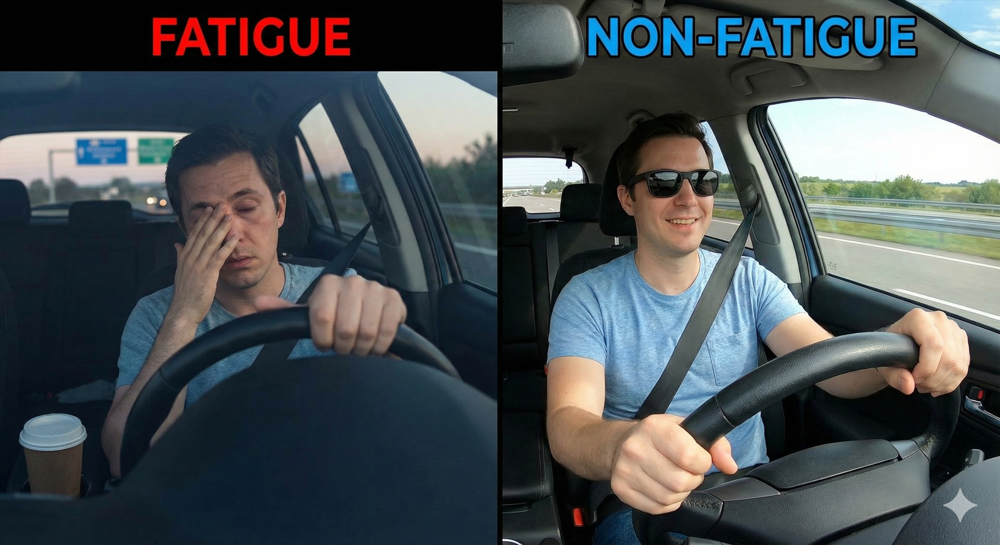

<div style="background-color:#F5F7FA; border-radius: 10px; padding: 20px; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; box-shadow: 0 4px 6px rgba(0,0,0,0.1);">
    
<div style="background: linear-gradient(90deg, #4b6cb7 0%, #182848 100%); color: white; padding: 20px; border-radius: 8px 8px 0 0; text-align: center;">
        <h1 style="margin:0; font-size: 28px;">😴 Fatigue Detection Dataset</h1>
        <p style="margin:5px 0 0 0; opacity: 0.9; font-size: 16px;">Facial State Recognition for Safety-Critical Environments</p>
    </div>

 <div style="padding: 20px; color: #333; line-height: 1.6;">
        <p><strong>Fatigue detection</strong> plays an essential role in transportation, healthcare, and industrial monitoring. This dataset was compiled to assist researchers in developing deep learning systems to recognize signs of tiredness using facial analysis.</p>
        
 <hr style="border: 0; height: 1px; background-image: linear-gradient(to right, rgba(0, 0, 0, 0), rgba(0, 0, 0, 0.2), rgba(0, 0, 0, 0)); margin: 20px 0;">

<div style="display: flex; flex-wrap: wrap; gap: 20px; justify-content: space-around; text-align: center; margin-bottom: 20px;">
            <div style="background: white; padding: 15px; border-radius: 8px; flex: 1; min-width: 150px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
                <span style="font-size: 30px;">🖼️</span>
                <h3 style="margin: 5px 0; color: #4b6cb7;">2,200</h3>
                <p style="margin: 0; font-size: 14px; color: #666;">Total Images</p>
            </div>
            <div style="background: white; padding: 15px; border-radius: 8px; flex: 1; min-width: 150px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
                <span style="font-size: 30px;">⚖️</span>
                <h3 style="margin: 5px 0; color: #4b6cb7;">Balanced</h3>
                <p style="margin: 0; font-size: 14px; color: #666;">50% Fatigue / 50% Non</p>
            </div>
            <div style="background: white; padding: 15px; border-radius: 8px; flex: 1; min-width: 150px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
                <span style="font-size: 30px;">🔍</span>
                <h3 style="margin: 5px 0; color: #4b6cb7;">Curated</h3>
                <p style="margin: 0; font-size: 14px; color: #666;">Manually Inspected</p>
            </div>
        </div>

 <div style="background-color: #e3eafc; padding: 15px; border-radius: 8px; border-left: 5px solid #4b6cb7;">
            <h4 style="margin-top: 0; color: #182848;">🎯 Dataset Objectives</h4>
            <ul style="margin-bottom: 0; padding-left: 20px;">
                <li>Support research in <strong>fatigue detection</strong> systems.</li>
                <li>Facilitate the development of <strong>CNN architectures</strong> and Transfer Learning.</li>
                <li>Benchmark facial state recognition models.</li>
            </ul>
        </div>
    </div>
</div>

<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
    📚 Importing Libraries
  </h1>
</div>


In [2]:
#pip install "protobuf==3.20.3"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 3.9 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.33.0
    Uninstalling protobuf-6.33.0:
      Successfully uninstalled protobuf-6.33.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
opentelemetry-proto 1.37.0 requires protobuf<7.0,>=5.0, but you have protobuf 3.20.3 which is incompatible.
onnx 1.18.0 requires protobuf>=4.25.1, but you have protobuf 3.20.3 which is incompatible.
a2a-sdk 0.3.10 requires protobuf>=5.29.5, but you have protobuf 3.20.3 which is incompatible.
ray 2.51.1 requires click!=8.3.0,>=7.0, but you have click 8.3.0 which is incompatible.
bigframes 2.12.0 requires rich<14,>=12.4.4, but you have rich 14.2.0 which is incompatible.
tens

In [134]:
import os


from sklearn.metrics import f1_score, confusion_matrix
import cv2
import shutil
import numpy as np
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2,ResNet50,VGG16
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------ 1.  ------------------
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
from rich import print
print("[green]Importing Libraries Successfully...[green]")

Importing Libraries Successfully...


<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
    📂 Load the data
  </h1>
</div>


In [135]:
dir= '/kaggle/input/fatigue-dataset/Data'

<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
    🔢 Count Of Data
  </h1>
</div>


In [136]:
fatigue_count = len(os.listdir("/kaggle/input/fatigue-dataset/Data/Fatigue"))
non_fatigue_count = len(os.listdir("/kaggle/input/fatigue-dataset/Data/NonFatigue"))

print("# of images in Fatigue:", fatigue_count)
print("# of images in NonFatigue:", non_fatigue_count)

# of images in Fatigue: 1100

# of images in NonFatigue: 1100


<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🔍 Display Random images
  </h1>
</div>


In [137]:

# Path to the original dataset (already defined in previous cells)
original_data_dir = dir
classes = ["Fatigue", "NonFatigue"]

all_image_paths = []
for cls in classes:
    cls_dir = os.path.join(original_data_dir, cls)
    images = [os.path.join(cls_dir, img) for img in os.listdir(cls_dir)]
    all_image_paths.extend(images)

# Define the number of random samples you want
num_samples = 3 # Example: get 10 random image paths

# Ensure num_samples does not exceed the total number of images
if num_samples > len(all_image_paths):
    num_samples = len(all_image_paths)

random_sample_paths = random.sample(all_image_paths, num_samples)

print(f"Random sample of {num_samples} image paths:")
for path in random_sample_paths:
    print(path)

Random sample of 3 image paths:

/kaggle/input/fatigue-dataset/Data/Fatigue/0187.jpg

/kaggle/input/fatigue-dataset/Data/Fatigue/0478.jpg

/kaggle/input/fatigue-dataset/Data/Fatigue/0920.jpg

 Displaying sampled images...

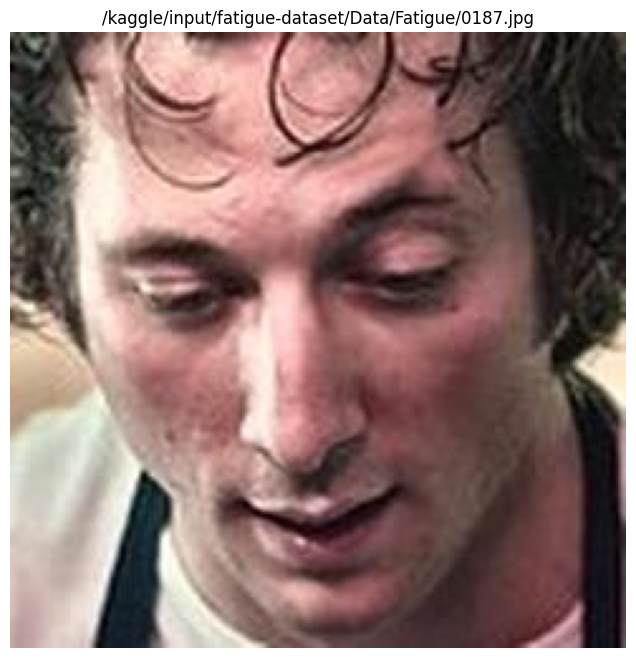

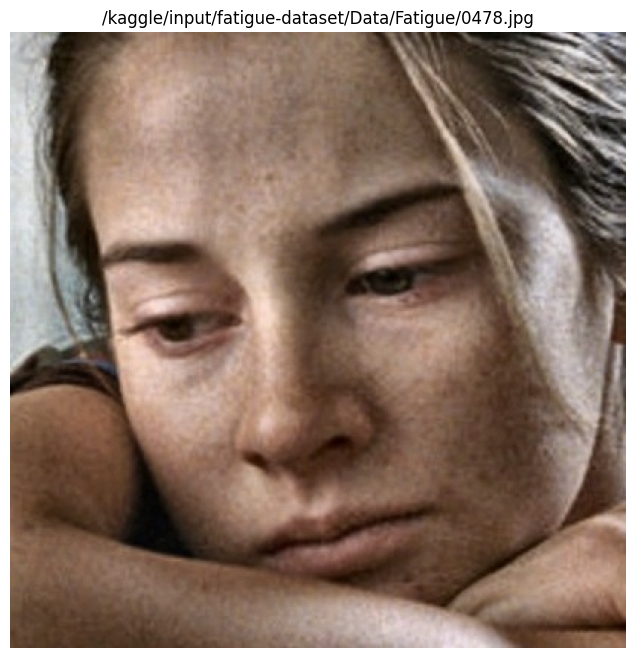

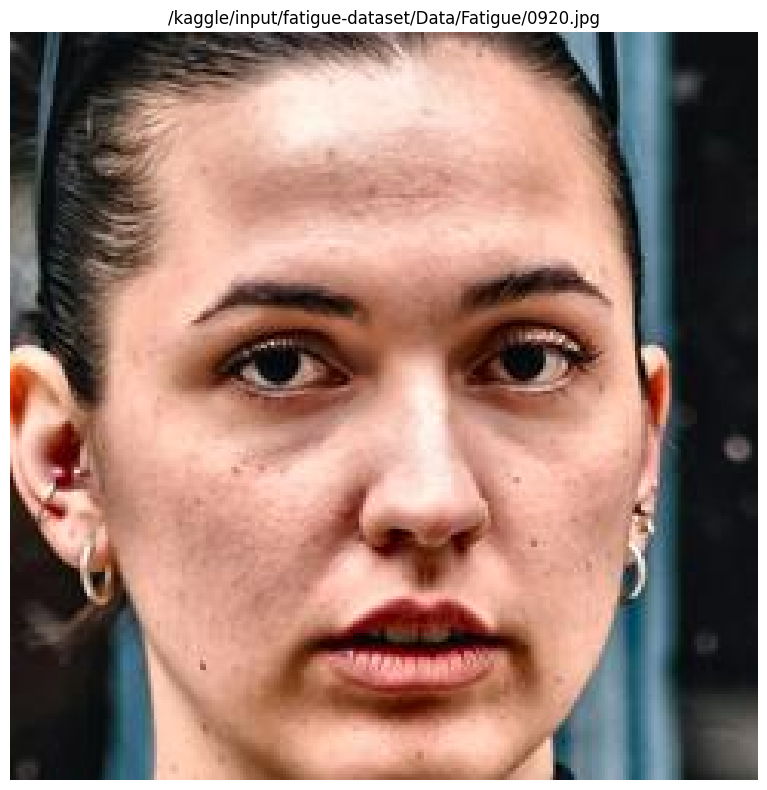

Sampled images displayed.

In [138]:


print("[green] Displaying sampled images...[green]")

for img_path in random_sample_paths:
    plt.figure(figsize=(8, 8))  # Create a new figure for each image
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(img_path)
    plt.axis('off')  # Hide axis ticks and labels

plt.tight_layout() # Adjust layout to prevent titles from overlapping
plt.show()

print("[green]Sampled images displayed.[green]")



<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🤖 Make CNN Model → 1
  </h1>
</div>


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    1️⃣ Split Dataset
  </h2>
</div>


In [139]:

original_data_dir = dir
split_data_dir = "dataset_split"  # new folder for split
classes = ["Fatigue", "NonFatigue"]
splits = ["train", "val", "test"]
split_ratio = [0.5, 0.2, 0.3]  # train/val/test

# Create folders
for split in splits:
    for cls in classes:
        os.makedirs(os.path.join(split_data_dir, split, cls), exist_ok=True)

# Split and copy images
for cls in classes:
    cls_dir = os.path.join(original_data_dir, cls)
    images = os.listdir(cls_dir)
    np.random.seed(42)
    np.random.shuffle(images)

    n_total = len(images)
    n_train = int(n_total * split_ratio[0])
    n_val = int(n_total * split_ratio[1])

    train_imgs = images[:n_train]
    val_imgs = images[n_train:n_train+n_val]
    test_imgs = images[n_train+n_val:]

    for img_name in train_imgs:
        shutil.copy(os.path.join(cls_dir, img_name), os.path.join(split_data_dir, "train", cls, img_name))
    for img_name in val_imgs:
        shutil.copy(os.path.join(cls_dir, img_name), os.path.join(split_data_dir, "val", cls, img_name))
    for img_name in test_imgs:
        shutil.copy(os.path.join(cls_dir, img_name), os.path.join(split_data_dir, "test", cls, img_name))

print("[green]Data successfully split into train/val/test![green]")

Data successfully split into train/val/test!

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    2️⃣ ImageDataGenerators
  </h2>
</div>

In [149]:
# 1. Define the custom blur function
def random_blur(img):
    # Apply blur with 50% probability
    if np.random.rand() < 0.5:
        # (5, 5) is the kernel size. Increase to (7,7) for stronger blur.
        return cv2.GaussianBlur(img, (5, 5), 0) 
    return img

img_size = (224, 224)
batch_size = 32

# 2. Add 'preprocessing_function' to your training generator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    horizontal_flip=True,
    rotation_range=15,
    preprocessing_function=random_blur  # <--- Added blur here
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join(split_data_dir, "train"), target_size=img_size,
    batch_size=batch_size, class_mode='categorical', shuffle=False
)
val_generator = val_datagen.flow_from_directory(
    os.path.join(split_data_dir, "val"), target_size=img_size,
    batch_size=batch_size, class_mode='categorical', shuffle=False
)
test_generator = test_datagen.flow_from_directory(
    os.path.join(split_data_dir, "test"), target_size=img_size,
    batch_size=batch_size, class_mode='categorical', shuffle=False
)

Found 1100 images belonging to 2 classes.
Found 440 images belonging to 2 classes.
Found 660 images belonging to 2 classes.


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    3️⃣ Build MobileNetV2 + CNN
  </h2>
</div>


In [150]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False  # Freeze base

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

model_cnn_mobilenet = Model(inputs=base_model.input, outputs=predictions)

model_cnn_mobilenet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_cnn_mobilenet.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_32[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,914,882 (11.12 MB)

 Trainable params: 656,898 (2.51 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    4️⃣ Callbacks
  </h2>
</div>


In [151]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)
]


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    5️⃣ Train
  </h2>
</div>


In [152]:
history = model_cnn_mobilenet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=callbacks
)


Epoch 1/20
34/35 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.6939 - loss: 0.6972

35/35 ━━━━━━━━━━━━━━━━━━━━ 30s 593ms/step - accuracy: 0.6913 - loss: 0.6965 - val_accuracy: 0.6568 - val_loss: 0.6185
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.7153 - loss: 0.5459

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 413ms/step - accuracy: 0.7139 - loss: 0.5473 - val_accuracy: 0.7250 - val_loss: 0.5778
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.6189 - loss: 0.7062

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 415ms/step - accuracy: 0.6210 - loss: 0.7030 - val_accuracy: 0.7250 - val_loss: 0.5605
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.7588 - loss: 0.4889

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 413ms/step - accuracy: 0.7584 - loss: 0.4892 - val_accuracy: 0.7614 - val_loss: 0.4968
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - accuracy: 0.7190 - loss: 0.5227

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 416ms/step - accuracy: 0.7194 - loss: 0.5220 - val_accuracy: 0.7682 - val_loss: 0.4895
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 406ms/step - accuracy: 0.7873 - loss: 0.4588 - val_accuracy: 0.7386 - val_loss: 0.5183
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.7899 - loss: 0.4529

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 409ms/step - accuracy: 0.7893 - loss: 0.4537 - val_accuracy: 0.7932 - val_loss: 0.4340
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 401ms/step - accuracy: 0.8192 - loss: 0.3939 - val_accuracy: 0.7295 - val_loss: 0.5225
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 402ms/step - accuracy: 0.8034 - loss: 0.4486 - val_accuracy: 0.7250 - val_loss: 0.5463
Epoch 10/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 388ms/step - accuracy: 0.8006 - loss: 0.4641 - val_accuracy: 0.7795 - val_loss: 0.4536
Epoch 11/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.7883 - loss: 0.4413

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 408ms/step - accuracy: 0.7885 - loss: 0.4410 - val_accuracy: 0.8000 - val_loss: 0.4206
Epoch 12/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.8283 - loss: 0.3952

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 403ms/step - accuracy: 0.8279 - loss: 0.3953 - val_accuracy: 0.8205 - val_loss: 0.4107
Epoch 13/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 399ms/step - accuracy: 0.8278 - loss: 0.3799 - val_accuracy: 0.8023 - val_loss: 0.4147
Epoch 14/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 393ms/step - accuracy: 0.8354 - loss: 0.3760 - val_accuracy: 0.7000 - val_loss: 0.6546
Epoch 15/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 406ms/step - accuracy: 0.7163 - loss: 0.6292 - val_accuracy: 0.7795 - val_loss: 0.4598
Epoch 16/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.8254 - loss: 0.4144

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 410ms/step - accuracy: 0.8254 - loss: 0.4138 - val_accuracy: 0.8182 - val_loss: 0.3988
Epoch 17/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 406ms/step - accuracy: 0.8453 - loss: 0.3663 - val_accuracy: 0.8136 - val_loss: 0.4025
Epoch 18/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 404ms/step - accuracy: 0.8176 - loss: 0.3830 - val_accuracy: 0.7818 - val_loss: 0.4489
Epoch 19/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 397ms/step - accuracy: 0.8402 - loss: 0.3658 - val_accuracy: 0.8068 - val_loss: 0.4186
Epoch 20/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.8401 - loss: 0.3498

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 415ms/step - accuracy: 0.8398 - loss: 0.3507 - val_accuracy: 0.8136 - val_loss: 0.3979


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    6️⃣ Evaluate
  </h2>
</div>


21/21 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step


Test Accuracy: 0.8227

F1 Score: 0.8227

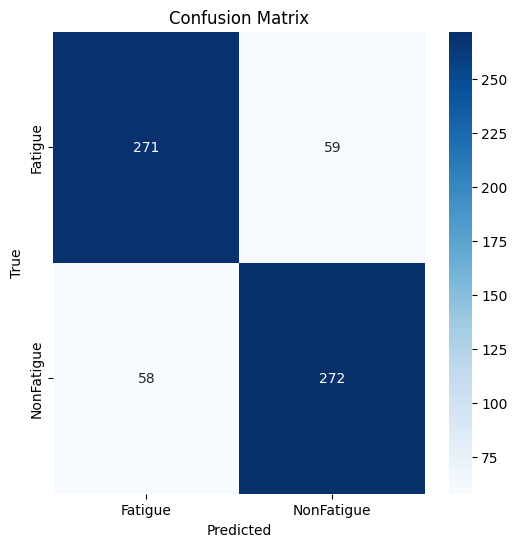

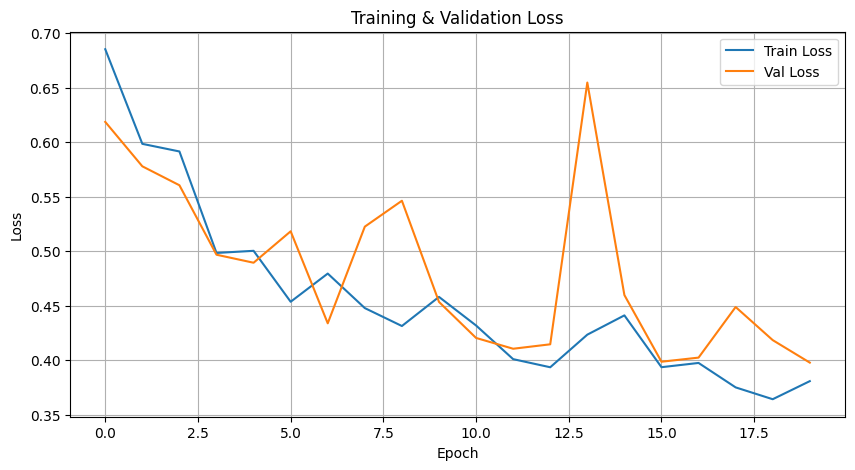

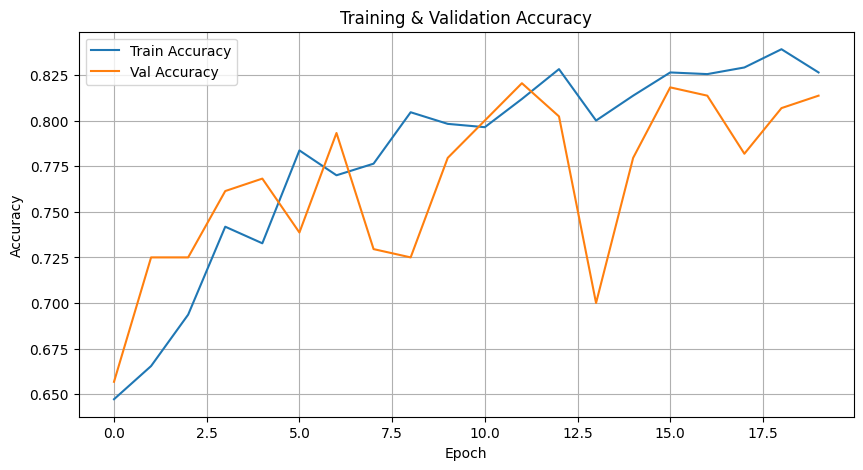

In [153]:
predictions = model_cnn_mobilenet.predict(test_generator, steps=test_generator.n // batch_size + 1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Accuracy
test_accuracy = np.mean(y_pred == y_true)
print(f"Test Accuracy: {test_accuracy:.4f}")

# F1 Score
f1 = f1_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training history
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    3️⃣.1️⃣ ResNet50 + CNN
  </h2>
</div>


In [155]:
# 1. Instantiate ResNet50 instead of ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False  # Freeze base

# 2. Rebuild the classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# 3. Create the model
model_resnet = Model(inputs=base_model.input, outputs=predictions)

# 4. Compile
model_resnet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_resnet.summary()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_33[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,637,826 (93.99 MB)

 Trainable params: 1,050,114 (4.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    4️⃣.1️⃣ Callbacks
  </h2>
</div>


In [156]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)
]

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    5️⃣.1️⃣ Train
  </h2>
</div>


In [157]:
history = model_resnet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=callbacks
)

Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.3701 - loss: 0.8510

35/35 ━━━━━━━━━━━━━━━━━━━━ 36s 637ms/step - accuracy: 0.3709 - loss: 0.8516 - val_accuracy: 0.5000 - val_loss: 0.7023
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.2967 - loss: 0.7330

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 423ms/step - accuracy: 0.2972 - loss: 0.7332 - val_accuracy: 0.5000 - val_loss: 0.6989
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 401ms/step - accuracy: 0.4841 - loss: 0.7240 - val_accuracy: 0.5000 - val_loss: 0.7186
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - accuracy: 0.5224 - loss: 0.6927

35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 409ms/step - accuracy: 0.5214 - loss: 0.6930 - val_accuracy: 0.6000 - val_loss: 0.6831
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 397ms/step - accuracy: 0.5765 - loss: 0.7420 - val_accuracy: 0.5000 - val_loss: 0.7460
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 399ms/step - accuracy: 0.3618 - loss: 0.7651 - val_accuracy: 0.5341 - val_loss: 0.6832
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 404ms/step - accuracy: 0.5941 - loss: 0.7091 - val_accuracy: 0.5000 - val_loss: 0.8421
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 394ms/step - accuracy: 0.6047 - loss: 0.6842 - val_accuracy: 0.5000 - val_loss: 0.7373
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 406ms/step - accuracy: 0.4002 - loss: 0.7840 - val_accuracy: 0.5000 - val_loss: 0.7195


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    6️⃣.1️⃣ Evaluate
  </h2>
</div>

21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 295ms/step


Test Accuracy: 0.6106

F1 Score: 0.5951

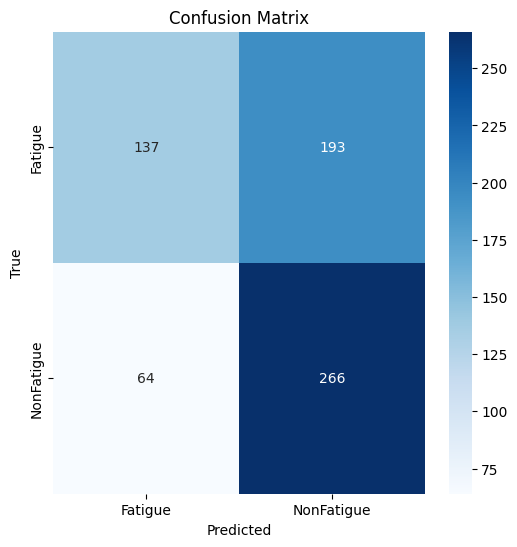

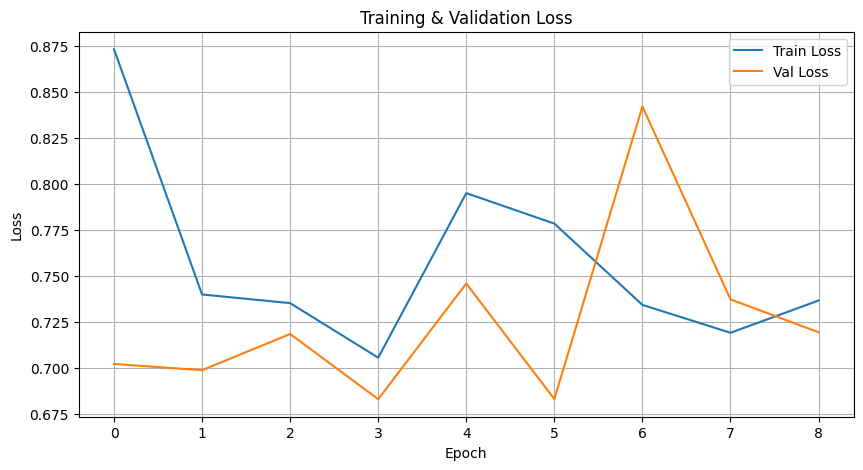

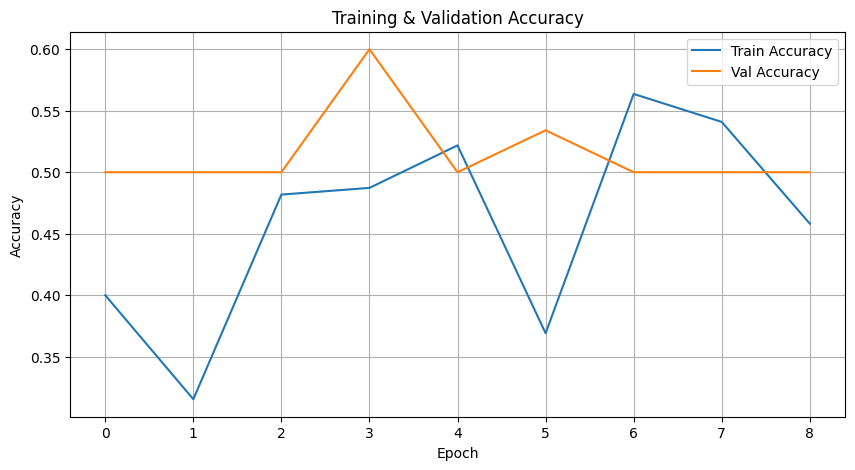

In [158]:
predictions = model_resnet.predict(test_generator, steps=test_generator.n // batch_size + 1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Accuracy
test_accuracy = np.mean(y_pred == y_true)
print(f"Test Accuracy: {test_accuracy:.4f}")

# F1 Score
f1 = f1_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training history
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    3️⃣.2️⃣ VGG16 +CNN
  </h2>
</div>

In [160]:
# 1. Instantiate ResNet50 instead of VGG16
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False  # Freeze base

# 2. Rebuild the classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# 3. Create the model
model_vgg = Model(inputs=base_model.input, outputs=predictions)

# 4. Compile
model_vgg.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_vgg.summary()

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_34 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_15     │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,978,370 (57.14 MB)

 Trainable params: 263,682 (1.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    4️⃣.2️⃣ Callbacks
  </h2>
</div>

In [161]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)
]


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    5️⃣.2️⃣ Train
  </h2>
</div>


In [162]:
history = model_vgg.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=callbacks
)


Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.4340 - loss: 0.7470

35/35 ━━━━━━━━━━━━━━━━━━━━ 18s 454ms/step - accuracy: 0.4349 - loss: 0.7463 - val_accuracy: 0.5636 - val_loss: 0.6812
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 426ms/step - accuracy: 0.5615 - loss: 0.6912 - val_accuracy: 0.5023 - val_loss: 0.6978
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step - accuracy: 0.5465 - loss: 0.6834

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 426ms/step - accuracy: 0.5476 - loss: 0.6830 - val_accuracy: 0.6818 - val_loss: 0.6287
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.6591 - loss: 0.6477

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 429ms/step - accuracy: 0.6590 - loss: 0.6474 - val_accuracy: 0.6659 - val_loss: 0.6157
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.6551 - loss: 0.6375

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 428ms/step - accuracy: 0.6532 - loss: 0.6384 - val_accuracy: 0.7159 - val_loss: 0.6002
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.6767 - loss: 0.6162

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 413ms/step - accuracy: 0.6767 - loss: 0.6164 - val_accuracy: 0.7568 - val_loss: 0.5768
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 418ms/step - accuracy: 0.7328 - loss: 0.5902 - val_accuracy: 0.6705 - val_loss: 0.5831
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.6347 - loss: 0.6595

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 433ms/step - accuracy: 0.6360 - loss: 0.6583 - val_accuracy: 0.7386 - val_loss: 0.5603
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.7441 - loss: 0.5675

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 424ms/step - accuracy: 0.7421 - loss: 0.5686 - val_accuracy: 0.7523 - val_loss: 0.5474
Epoch 10/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 420ms/step - accuracy: 0.7027 - loss: 0.5689 - val_accuracy: 0.7159 - val_loss: 0.5510
Epoch 11/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - accuracy: 0.7013 - loss: 0.5822

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 422ms/step - accuracy: 0.7012 - loss: 0.5820 - val_accuracy: 0.7659 - val_loss: 0.5287
Epoch 12/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 414ms/step - accuracy: 0.7384 - loss: 0.5643 - val_accuracy: 0.6841 - val_loss: 0.5520
Epoch 13/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.7153 - loss: 0.5805

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 418ms/step - accuracy: 0.7160 - loss: 0.5798 - val_accuracy: 0.7773 - val_loss: 0.5162
Epoch 14/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.7212 - loss: 0.5494

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 421ms/step - accuracy: 0.7215 - loss: 0.5493 - val_accuracy: 0.7773 - val_loss: 0.5098
Epoch 15/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.7414 - loss: 0.5569

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 413ms/step - accuracy: 0.7408 - loss: 0.5571 - val_accuracy: 0.7795 - val_loss: 0.5050
Epoch 16/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7368 - loss: 0.5492

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 426ms/step - accuracy: 0.7365 - loss: 0.5496 - val_accuracy: 0.7841 - val_loss: 0.5010
Epoch 17/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7387 - loss: 0.5456

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 429ms/step - accuracy: 0.7392 - loss: 0.5454 - val_accuracy: 0.7682 - val_loss: 0.4979
Epoch 18/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.7237 - loss: 0.5309

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 418ms/step - accuracy: 0.7237 - loss: 0.5311 - val_accuracy: 0.7795 - val_loss: 0.4978
Epoch 19/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.7414 - loss: 0.5278

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 420ms/step - accuracy: 0.7408 - loss: 0.5285 - val_accuracy: 0.7705 - val_loss: 0.4914
Epoch 20/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.7339 - loss: 0.5361

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 416ms/step - accuracy: 0.7343 - loss: 0.5359 - val_accuracy: 0.7864 - val_loss: 0.4900


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    6️⃣.2️⃣ Evaluate
  </h2>
</div>

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step


Test Accuracy: 0.7712

F1 Score: 0.7674

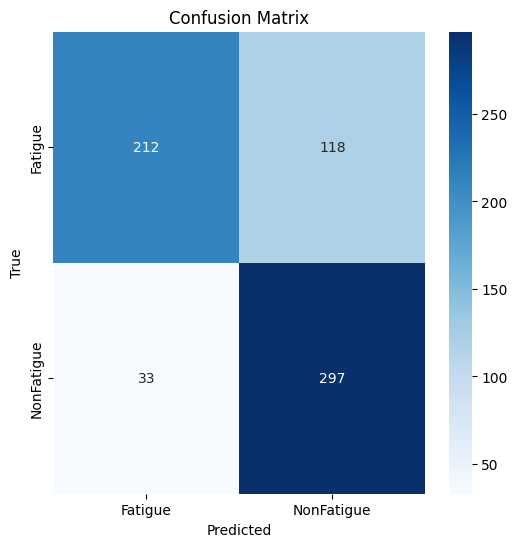

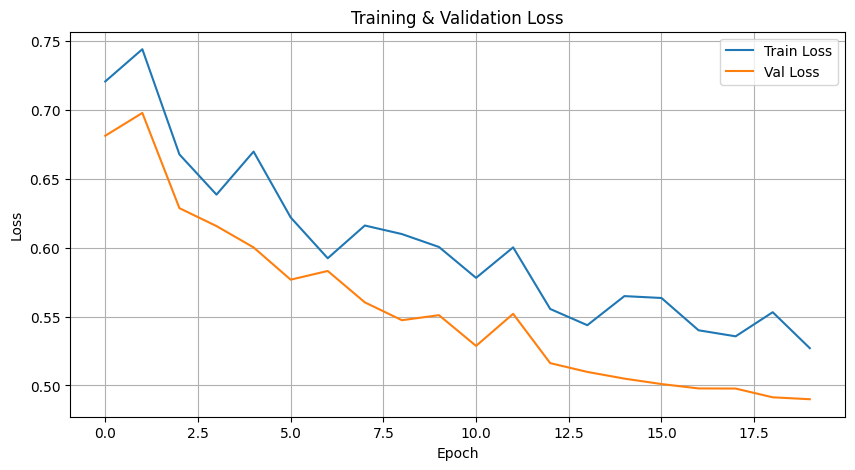

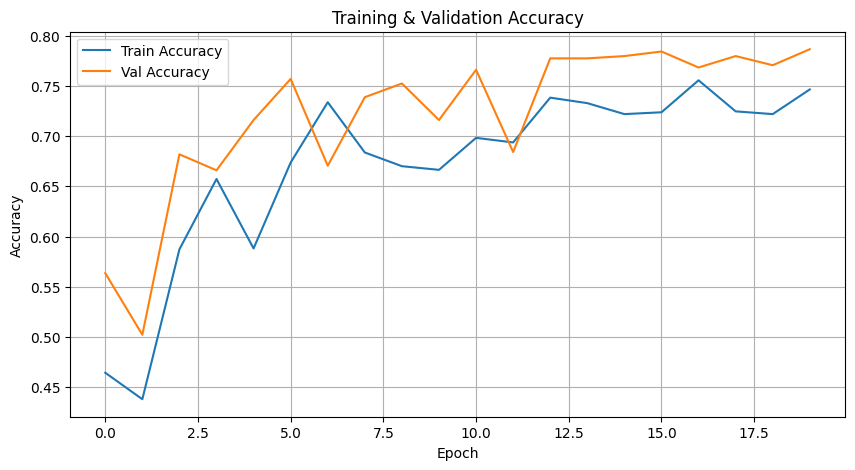

In [163]:
predictions = model_vgg.predict(test_generator, steps=test_generator.n // batch_size + 1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Accuracy
test_accuracy = np.mean(y_pred == y_true)
print(f"Test Accuracy: {test_accuracy:.4f}")

# F1 Score
f1 = f1_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training history
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()



<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🤖 Make ANN Model --> 2
  </h1>
</div>



<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    0️⃣ Extract Features
  </h2>
</div>



In [165]:
# 1. Load the Base Model (MobileNetV2)
# include_top=False removes the classification layer
# pooling='avg' converts the output 3D features into a 1D vector
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3), pooling='avg')

# 2. Extract Features from the Training Generator
print("Extracting features from Training Data...")

# IMPORTANT: We must reset the generator to ensure order
train_generator.reset()

# This line creates 'train_features' which contains the numbers your ANN needs
train_features = base_model.predict(train_generator)
train_labels = train_generator.classes

print(f"Feature Extraction Complete.")
print(f"Train Features Shape: {train_features.shape}") # Should look like (num_images, 1280)

print("Extracting features from Validation Data...")

# 1. Reset the validation generator
# IMPORTANT: Use 'val_generator' or 'validation_generator' depending on what you named it earlier
val_generator.reset()

# 2. Extract features using the SAME base_model you defined earlier
val_features = base_model.predict(val_generator)

# 3. Get the labels
val_labels = val_generator.classes

print(f"Validation Feature Extraction Complete.")
print(f"Val Features Shape: {val_features.shape}")
print(f"Val Labels Shape: {val_labels.shape}")

print("Extracting features from Test Data...")

# 1. Reset the test generator to ensure order
test_generator.reset()

# 2. Extract features using the pre-trained base_model
test_features = base_model.predict(test_generator)

# 3. Get the true labels for evaluation
test_labels = test_generator.classes

print(f"Test Feature Extraction Complete.")
print(f"Test Features Shape: {test_features.shape}")

Extracting features from Training Data...

35/35 ━━━━━━━━━━━━━━━━━━━━ 19s 452ms/step


Feature Extraction Complete.

Train Features Shape: (1100, 1280)

Extracting features from Validation Data...

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step


Validation Feature Extraction Complete.

Val Features Shape: (440, 1280)

Val Labels Shape: (440,)

Extracting features from Test Data...

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step


Test Feature Extraction Complete.

Test Features Shape: (660, 1280)



<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    1️⃣ Define ANN model
  </h2>
</div>


In [169]:
from tensorflow.keras.activations import swish,gelu,elu,relu

ann_model = Sequential([
    Input(shape=(train_features.shape[1],)), 
    
    # Pass the function object instead of a string
    Dense(512, activation=gelu), 
    Dropout(0.5),
    Dense(256, activation=gelu),
    Dropout(0.5),
     Dense(128, activation=gelu), 
    Dense(64, activation=gelu),
     Dense(32, activation=gelu), 
    Dense(16, activation=gelu),
    Dropout(0.5),
    Dense(8, activation=swish),
    Dense(2, activation='softmax')
])



ann_model.compile(
    optimizer=Adam(0.001),
    # FIX: Use 'sparse' version for integer labels (0, 1)
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

ann_model.summary()





Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_142 (Dense)               │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 831,114 (3.17 MB)

 Trainable params: 831,114 (3.17 MB)

 Non-trainable params: 0 (0.00 B)

<table style="width:100%; border-collapse: collapse; text-align: center;">
  <tr style="background-color:#2b2b2b; color:white;">
    <th style="border:1px solid #555; padding:8px;">Activation Function</th>
    <th style="border:1px solid #555; padding:8px;">Formula</th>
    <th style="border:1px solid #555; padding:8px;">Output Range</th>
    <th style="border:1px solid #555; padding:8px;">Best Used For</th>
    <th style="border:1px solid #555; padding:8px;">Pros</th>
    <th style="border:1px solid #555; padding:8px;">Cons</th>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">Sigmoid</td>
    <td style="border:1px solid #555; padding:8px;">1 / (1 + e<sup>−x</sup>)</td>
    <td style="border:1px solid #555; padding:8px;">(0, 1)</td>
    <td style="border:1px solid #555; padding:8px;">Binary Output</td>
    <td style="border:1px solid #555; padding:8px;">Simple interpretation as probability.</td>
    <td style="border:1px solid #555; padding:8px;">Vanishing Gradient in deep networks.</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">Softmax</td>
    <td style="border:1px solid #555; padding:8px;">e<sup>xᵢ</sup> / Σ e<sup>xⱼ</sup></td>
    <td style="border:1px solid #555; padding:8px;">(0, 1)</td>
    <td style="border:1px solid #555; padding:8px;">Multi-Class Output</td>
    <td style="border:1px solid #555; padding:8px;">Outputs sum to 1 (probabilities).</td>
    <td style="border:1px solid #555; padding:8px;">Only used in final layer.</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">ReLU</td>
    <td style="border:1px solid #555; padding:8px;">max(0, x)</td>
    <td style="border:1px solid #555; padding:8px;">[0, ∞)</td>
    <td style="border:1px solid #555; padding:8px;">Hidden Layers (Default)</td>
    <td style="border:1px solid #555; padding:8px;">Fast; reduces vanishing gradient.</td>
    <td style="border:1px solid #555; padding:8px;">Dying ReLU problem.</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">Leaky ReLU</td>
    <td style="border:1px solid #555; padding:8px;">max(αx, x)</td>
    <td style="border:1px solid #555; padding:8px;">(−∞, ∞)</td>
    <td style="border:1px solid #555; padding:8px;">Deep Hidden Layers</td>
    <td style="border:1px solid #555; padding:8px;">Fixes dying ReLU.</td>
    <td style="border:1px solid #555; padding:8px;">Requires α tuning.</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">Swish</td>
    <td style="border:1px solid #555; padding:8px;">x · sigmoid(x)</td>
    <td style="border:1px solid #555; padding:8px;">(~−0.28, ∞)</td>
    <td style="border:1px solid #555; padding:8px;">Hidden Layers (SOTA)</td>
    <td style="border:1px solid #555; padding:8px;">Smooth; great for optimization.</td>
    <td style="border:1px solid #555; padding:8px;">Slower than ReLU.</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:8px;">GELU</td>
    <td style="border:1px solid #555; padding:8px;">x · Φ(x)</td>
    <td style="border:1px solid #555; padding:8px;">(~−0.17, ∞)</td>
    <td style="border:1px solid #555; padding:8px;">Transformers (BERT/GPT)</td>
    <td style="border:1px solid #555; padding:8px;">State-of-the-art performance.</td>
    <td style="border:1px solid #555; padding:8px;">Complex & slower.</td>
  </tr>

</table>



<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    2️⃣ Callbacks 
  </h2>
</div>

In [170]:
callbacks_ann = [
    EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True),
    ModelCheckpoint('best_ann_model.h5', monitor='val_loss', save_best_only=True)
]


<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    3️⃣ Train ANN
  </h2>
</div>


In [171]:
history_ann = ann_model.fit(
    train_features, train_labels, # Corrected: use train_features and train_labels
    validation_data=(val_features, val_labels),
    epochs=30,
    batch_size=12,
    callbacks=callbacks_ann
)

Epoch 1/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4858 - loss: 0.7471

92/92 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - accuracy: 0.4861 - loss: 0.7469 - val_accuracy: 0.7045 - val_loss: 0.6677
Epoch 2/30
79/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5617 - loss: 0.7038

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5605 - loss: 0.7024 - val_accuracy: 0.7091 - val_loss: 0.6478
Epoch 3/30
79/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6220 - loss: 0.6711

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6258 - loss: 0.6658 - val_accuracy: 0.6932 - val_loss: 0.5759
Epoch 4/30
79/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7427 - loss: 0.5500

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7411 - loss: 0.5502 - val_accuracy: 0.7727 - val_loss: 0.5337
Epoch 5/30
79/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7588 - loss: 0.5056

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7615 - loss: 0.5046 - val_accuracy: 0.8091 - val_loss: 0.4753
Epoch 6/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8190 - loss: 0.4502 - val_accuracy: 0.7886 - val_loss: 0.4757
Epoch 7/30
80/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7985 - loss: 0.4414

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7986 - loss: 0.4418 - val_accuracy: 0.8000 - val_loss: 0.4559
Epoch 8/30
79/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8416 - loss: 0.3866

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8395 - loss: 0.3895 - val_accuracy: 0.8159 - val_loss: 0.4131
Epoch 9/30
81/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8369 - loss: 0.3910

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8388 - loss: 0.3881 - val_accuracy: 0.8250 - val_loss: 0.4130
Epoch 10/30
83/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8672 - loss: 0.3548

92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8657 - loss: 0.3547 - val_accuracy: 0.8364 - val_loss: 0.3843
Epoch 11/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8296 - loss: 0.3795 - val_accuracy: 0.8023 - val_loss: 0.4333
Epoch 12/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8672 - loss: 0.3638 - val_accuracy: 0.8250 - val_loss: 0.4112
Epoch 13/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8684 - loss: 0.3146 - val_accuracy: 0.8182 - val_loss: 0.4368
Epoch 14/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8605 - loss: 0.3266 - val_accuracy: 0.8364 - val_loss: 0.3991
Epoch 15/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8540 - loss: 0.3134 - val_accuracy: 0.8318 - val_loss: 0.3984
Epoch 16/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9025 - loss: 0.2644 - val_accuracy: 0.8250 - val_loss: 0.4059
Epoch 17/30
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8976 - loss: 0.2664 - val_accuracy: 0.8227 - val_loss: 0.4

<div style="background:#0d1117; padding:12px 18px; border-left:5px solid #4DA3FF; border-radius:6px; margin:18px 0;">
  <h2 style="color:#4DA3FF; font-size:22px; margin:0;">
    4️⃣ Evaluate ANN
  </h2>
</div>


21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


ANN Test Accuracy: 0.8030

ANN F1 Score: 0.8023

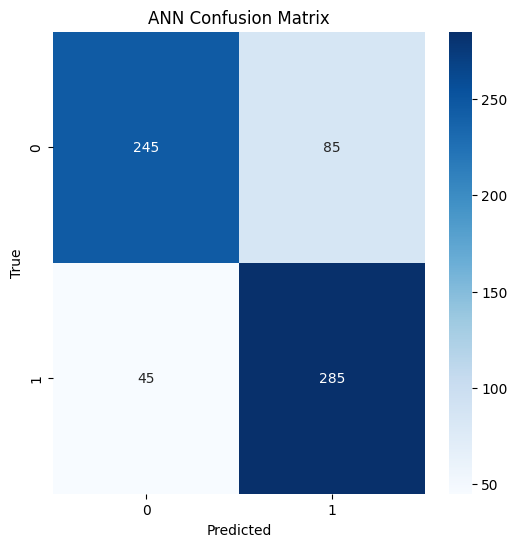

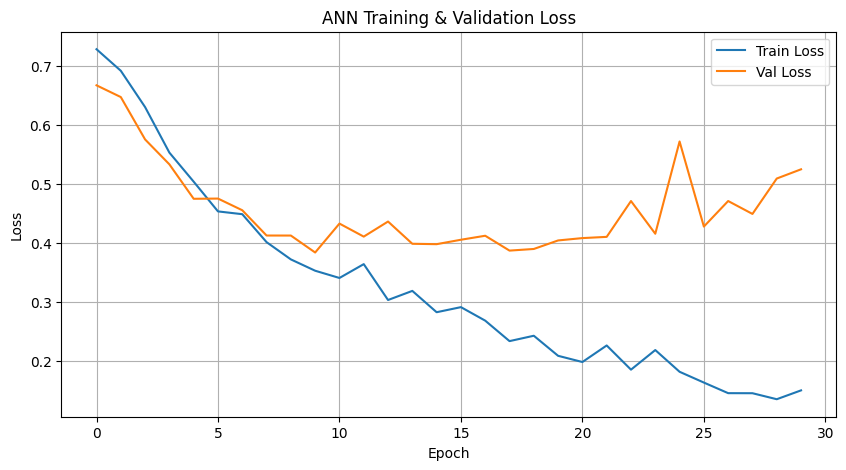

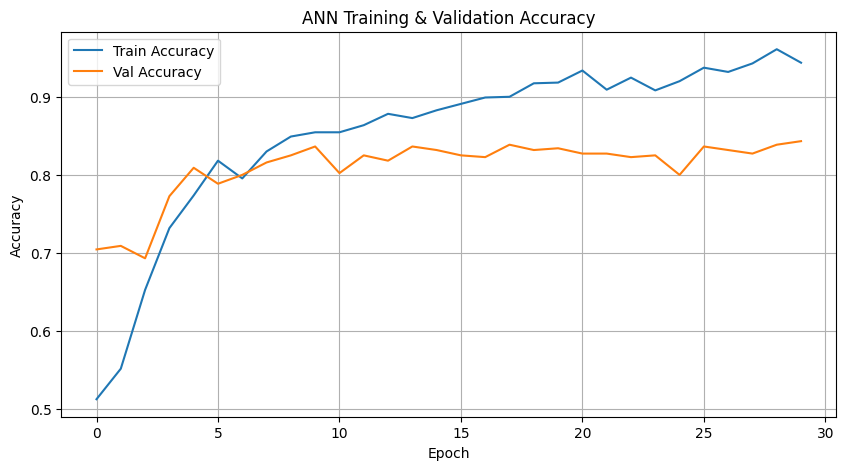

In [172]:
predictions = np.argmax(ann_model.predict(test_features), axis=1)
test_accuracy = np.mean(predictions == test_labels)
f1 = f1_score(test_labels, predictions, average='weighted')

print(f"ANN Test Accuracy: {test_accuracy:.4f}")
print(f"ANN F1 Score: {f1:.4f}")

# Confusion matrix
cm = confusion_matrix(test_labels, predictions)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('ANN Confusion Matrix')
plt.show()

# Plot training history
plt.figure(figsize=(10,5))
plt.plot(history_ann.history['loss'], label='Train Loss')
plt.plot(history_ann.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('ANN Training & Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(history_ann.history['accuracy'], label='Train Accuracy')
plt.plot(history_ann.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('ANN Training & Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()



<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🪄Auto Modeling
  </h1>
</div>


In [175]:
!pip install lazypredict


In [177]:
from lazypredict.Supervised import LazyClassifier


# 1. Check if labels are One-Hot (2 dimensions)
if len(train_labels.shape) > 1 and train_labels.shape[1] > 1:
    print(f"Converting Train Labels from {train_labels.shape} to 1D...")
    y_train_lazy = np.argmax(train_labels, axis=1)
else:
    y_train_lazy = train_labels

if len(test_labels.shape) > 1 and test_labels.shape[1] > 1:
    print(f"Converting Test Labels from {test_labels.shape} to 1D...")
    y_test_lazy = np.argmax(test_labels, axis=1)
else:
    y_test_lazy = test_labels

# 2. Run LazyPredict with the corrected 1D labels
print("Running LazyPredict with corrected labels...")
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)

# Use y_train_lazy and y_test_lazy here
models_summary, predictions = clf.fit(train_features, test_features, y_train_lazy, y_test_lazy)

print(models_summary)

Running LazyPredict with corrected labels...

  0%|          | 0/29 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 550, number of negative: 550
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 302054
[LightGBM] [Info] Number of data points in the train set: 1100, number of used features: 1280
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
NuSVC                              0.83               0.83     0.83      0.83   
SVC                                0.82               0.82     0.82      0.82   
LGBMClassifier                     0.81               0.81     0.81      0.81   
LogisticRegression                 0.80               0.80     0.80      0.80   
Perceptron                         0.80               0.80     0.80      0.80   
CalibratedClassifierCV             0.80               0.80     0.80      0.80   
PassiveAggressiveClassifier        0.80               0.80     0.80      0.80   
LinearSVC                          0.78               0.78     0.78      0.78   
SGDClassifier                      0.78               0.78     0.78      0.77   
XGBClassifier                      0.77               0.77     0.77      0.77   
ExtraTreesClassifier               0.77               0.77     0.77      0.76   
RandomForestClassifier             0.76               0.76     0.76      0.76   
AdaBoostClassifier                 0.76               0.76     0.76      0.76   
NearestCentroid                    0.73               0.73     0.73      0.73   
BernoulliNB                        0.73               0.73     0.73      0.73   
KNeighborsClassifier               0.71               0.71     0.71      0.71   
BaggingClassifier                  0.70               0.70     0.70      0.70   
GaussianNB                         0.69               0.69     0.69      0.68   
RidgeClassifierCV                  0.68               0.68     0.68      0.68   
RidgeClassifier                    0.63               0.63     0.63      0.63   
LinearDiscriminantAnalysis         0.63               0.63     0.63      0.63   
DecisionTreeClassifier             0.61               0.61     0.61      0.61   
ExtraTreeClassifier                0.59               0.59     0.59      0.59   
QuadraticDiscriminantAnalysis      0.52               0.52     0.52      0.52   
DummyClassifier                    0.50               0.50     0.50      0.33   
LabelPropagation                   0.50               0.50     0.50      0.33   
LabelSpreading                     0.50               0.50     0.50      0.33   

                               Time Taken  
Model                                      
NuSVC                                1.13  
SVC                                  1.12  
LGBMClassifier                       6.87  
LogisticRegression                   0.28  
Perceptron                           0.16  
CalibratedClassifierCV               0.94  
PassiveAggressiveClassifier          0.22  
LinearSVC                            0.37  
SGDClassifier                        0.20  
XGBClassifier                        5.88  
ExtraTreesClassifier                 0.57  
RandomForestClassifier               1.90  
AdaBoostClassifier                   6.87  
NearestCentroid                      0.13  
BernoulliNB                          0.14  
KNeighborsClassifier                 0.21  
BaggingClassifier                    7.76  
GaussianNB                           0.12  
RidgeClassifierCV                    0.45  
RidgeClassifier                      0.17  
LinearDiscriminantAnalysis           0.93  
DecisionTreeClassifier               1.35  
ExtraTreeClassifier                  0.10  
QuadraticDiscriminantAnalysis        0.49  
DummyClassifier                      0.09  
LabelPropagation                     0.35  
LabelSpreading                       0.35


<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🤖 Make Stacking Model --> 3
  </h1>
</div>


In [178]:
from sklearn.svm import NuSVC, SVC
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression, Perceptron

# Instantiate the Top 5 best performing models
# Note: probability=True is often needed for Voting/Stacking classifiers later
nu_svc = NuSVC(probability=True, random_state=42)
svc = SVC(probability=True, random_state=42)
lgbm = LGBMClassifier(random_state=42) 
log_reg = LogisticRegression(random_state=42, solver='liblinear')
perceptron = Perceptron(random_state=42)

print("Top models instantiated successfully:")
print(f"- NuSVC: {nu_svc}")
print(f"- SVC: {svc}")
print(f"- LGBM Classifier: {lgbm}")
print(f"- Logistic Regression: {log_reg}")
print(f"- Perceptron: {perceptron}")

Top models instantiated successfully:

- NuSVC: NuSVC(probability=True, random_state=42)

- SVC: SVC(probability=True, random_state=42)

- LGBM Classifier: LGBMClassifier(random_state=42)

- Logistic Regression: LogisticRegression(random_state=42, solver='liblinear')

- Perceptron: Perceptron(random_state=42)

In [188]:
from sklearn.ensemble import StackingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# 1. Define the list of YOUR Top 5 Estimators (from LazyPredict)
# Ensure you have run the instantiation code from the previous step first!
estimators = [
    ('nu_svc', nu_svc),         # Rank 1
    ('svc', svc),               # Rank 2
    ('lgbm', lgbm),             # Rank 3
    ('lr', log_reg),            # Rank 4
    ('perceptron', perceptron)  # Rank 5
]
# 2. Define AdaBoost as the Meta-Learner
# We use a Decision Tree as the base for AdaBoost, which is standard
ada_meta = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=3), # Weak learner
    n_estimators=50,
    learning_rate=0.5,
    random_state=42
)
# 3. Build the StackingClassifier
stk_classifier = StackingClassifier(
    estimators=estimators,
    final_estimator=ada_meta,
    cv=5,                 # 5-fold cross-validation
    stack_method='auto',  # Will use predict_proba where available, decision_function otherwise
    n_jobs=-1,            # Use all cores
    passthrough=True      # Key feature: Pass original features + predictions to meta-learner
)

print("[green]StackingClassifier built successfully with Top 5 models:[green]")
print(f"Base Estimators: {[name for name, _ in stk_classifier.estimators]}")

# 4. Train the Stacking Classifier (The Step usually missing!)
print("[green]Training Stacking Classifier (this may take a moment)...[green]")
# Note: Ensure y_train_lazy and y_test_lazy are 1D arrays (not One-Hot)
stk_classifier.fit(train_features, y_train_lazy)

print("[green]Training Complete.[green]")

StackingClassifier built successfully with Top 5 models:

Base Estimators: ['nu_svc', 'svc', 'lgbm', 'lr', 'perceptron']

Training Stacking Classifier (this may take a moment)...

[LightGBM] [Info] Number of positive: 440, number of negative: 440
[LightGBM] [Info] Number of positive: 440, number of negative: 440
[LightGBM] [Info] Number of positive: 440, number of negative: 440
[LightGBM] [Info] Number of positive: 440, number of negative: 440
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.064543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 267204
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.158321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.122669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.179270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 267879
[LightGBM] [

Training Complete.

Starting StackingClassifier evaluation...

Test Accuracy: 0.7788

F1 Score: 0.7784

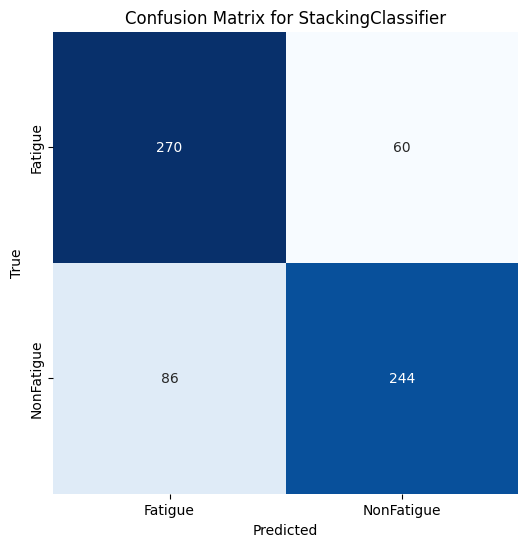

StackingClassifier evaluation complete.

In [189]:

print("Starting StackingClassifier evaluation...")
# Make predictions on the test set
predictions = stk_classifier.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
print(f"Test Accuracy: {accuracy:.4f}")

# Calculate F1-score
f1 = f1_score(test_labels, predictions, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Generate confusion matrix
cm = confusion_matrix(test_labels, predictions)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Fatigue', 'NonFatigue'], yticklabels=['Fatigue', 'NonFatigue'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for StackingClassifier')
plt.show()

print("StackingClassifier evaluation complete.")



<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🤖 Make Voting Model --> 4
  </h1>
</div>


In [192]:
from sklearn.ensemble import VotingClassifier

# Create a list of (name, estimator) tuples
estimators_vt = [
    ('nu_svc', nu_svc),         # Rank 1
    ('svc', svc),               # Rank 2
    ('lgbm', lgbm),             # Rank 3
    ('lr', log_reg),            # Rank 4
    ('perceptron', perceptron) , # Rank 5
    ('meta_ada',ada_meta)
]

# Instantiate VotingClassifier with 'soft' voting
vt_classifier = VotingClassifier(
    estimators=estimators_vt,
    voting='hard',  # Use 'soft' voting for probability-based predictions
    n_jobs=-1       # Use all available cores
)

print("VotingClassifier instantiated successfully with 'hard' voting:")
print(vt_classifier)

VotingClassifier instantiated successfully with 'hard' voting:

VotingClassifier(estimators=[('nu_svc',
                              NuSVC(probability=True, random_state=42)),
                             ('svc', SVC(probability=True, random_state=42)),
                             ('lgbm', LGBMClassifier(random_state=42)),
                             ('lr',
                              LogisticRegression(random_state=42,
                                                 solver='liblinear')),
                             ('perceptron', Perceptron(random_state=42)),
                             ('meta_ada',
                              AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3),
                                                 learning_rate=0.5,
                                                 random_state=42))],
                 n_jobs=-1)

In [193]:
print("Starting VotingClassifier training...")
vt_classifier.fit(train_features, train_labels)
print("VotingClassifier training complete.")

Starting VotingClassifier training...

[LightGBM] [Info] Number of positive: 550, number of negative: 550
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 288182
[LightGBM] [Info] Number of data points in the train set: 1100, number of used features: 1280
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


VotingClassifier training complete.

Starting VotingClassifier evaluation...

VotingClassifier Test Accuracy: 0.8258

VotingClassifier F1 Score: 0.8256

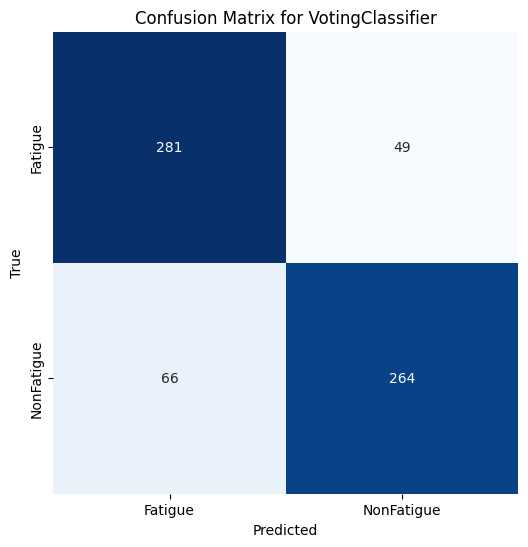

VotingClassifier evaluation complete.

In [194]:
print("Starting VotingClassifier evaluation...")
# Make predictions on the test set
vt_predictions = vt_classifier.predict(test_features)

# Calculate accuracy
vt_accuracy = accuracy_score(test_labels, vt_predictions)
print(f"VotingClassifier Test Accuracy: {vt_accuracy:.4f}")

# Calculate F1-score
vt_f1 = f1_score(test_labels, vt_predictions, average='weighted')
print(f"VotingClassifier F1 Score: {vt_f1:.4f}")

# Generate confusion matrix
vt_cm = confusion_matrix(test_labels, vt_predictions)
plt.figure(figsize=(6, 6))
sns.heatmap(vt_cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Fatigue', 'NonFatigue'], yticklabels=['Fatigue', 'NonFatigue'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for VotingClassifier')
plt.show()

print("VotingClassifier evaluation complete.")


<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  ⚖️ Compaire between models
  </h1>
</div>


<table style="width:100%; border-collapse: collapse; text-align:center;">
  <tr style="background-color:#1f1f1f; color:white;">
    <th style="border:1px solid #555; padding:10px;">Model</th>
    <th style="border:1px solid #555; padding:10px;">Accuracy</th>
    <th style="border:1px solid #555; padding:10px;">F1 Score</th>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">StackingClassifier</td>
    <td style="border:1px solid #555; padding:10px;">0.7788</td>
    <td style="border:1px solid #555; padding:10px;">0.7784</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">VotingClassifier</td>
    <td style="border:1px solid #555; padding:10px;">0.8258</td>
    <td style="border:1px solid #555; padding:10px;">0.8256</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">ANN</td>
    <td style="border:1px solid #555; padding:10px;">0.8030</td>
    <td style="border:1px solid #555; padding:10px;">0.8023</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">CNN + VGG</td>
    <td style="border:1px solid #555; padding:10px;">0.7712</td>
    <td style="border:1px solid #555; padding:10px;">0.7674</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">ResNet50 + CNN</td>
    <td style="border:1px solid #555; padding:10px;">0.6106</td>
    <td style="border:1px solid #555; padding:10px;">0.5951</td>
  </tr>

  <tr>
    <td style="border:1px solid #555; padding:10px;">MobileNet + CNN</td>
    <td style="border:1px solid #555; padding:10px;">0.8227</td>
    <td style="border:1px solid #555; padding:10px;">0.8227</td>
  </tr>
</table>



<div style="background:#0d1117; padding:15px 20px; border-left:5px solid #4DA3FF; border-radius:6px; margin:15px 0;">
  <h1 style="color:#4DA3FF; font-size:28px; margin:0;">
  🎉 Save best Model
  </h1>
</div>

In [196]:
import joblib

# Save the trained model to a file
joblib.dump(vt_classifier, 'drowsiness_detection_model.pkl')

print("Model saved successfully as 'drowsiness_detection_model.pkl'")

Model saved successfully as 'drowsiness_detection_model.pkl'

# Made by : Ali Osama ✍️